<a href="https://colab.research.google.com/github/karanidnani350/softwareengmgmt/blob/main/SEM_Assignment_Sprint_1_w_feedback.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [1]:
!pip install scanpy leidenalg
!pip install --upgrade seaborn

!pip install cellxgene-census
!pip install scanpy
!pip install pandas_profiling
!pip install pydantic-settings
!pip install ydata-profiling
!pip install jupyter-contrib-nbextensions
!pip install scikit-learn
!pip install igraph
!pip install scvi-tools
!pip install scikit-misc
!pip install leidenalg

# Import necessary libraries
import scanpy as sc
import matplotlib.pyplot as plt
import seaborn as sns
import numpy as np
import os
from google.colab import drive

# Mount Google Drive
drive.mount('/content/drive')


  Preparing metadata (setup.py) ... done
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 2.1/2.1 MB 65.4 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 2.0/2.0 MB 90.8 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 141.9/141.9 kB 15.7 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 3.1/3.1 MB 98.3 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 56.9/56.9 kB 6.6 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 88.8/88.8 kB 11.0 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 50.1/50.1 kB 5.5 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 83.6/83.6 kB 9.9 MB/s eta 0:00:00
  Created wheel for session-info: filename=session_info-1.0.0-py3-none-any.whl size=8023 sha256=be8406ff5e610bdd0f088981adc170a9191a1e7b3a6d06464436af4aa4d406ea
  Stored in directory: /root/.cache/pip/wheels/6a/aa/b9/eb5d4031476ec10802795b97ccf937b9bd998d68a9b268765a
Successfully built session-info
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━

In [2]:
gastritis_data = sc.read_h5ad("/content/drive/MyDrive/SEM Datasets/45b78a7b-6def-40f2-b27f-8eab7848602f.h5ad")
alzheimers_data = sc.read_h5ad("/content/drive/MyDrive/SEM Datasets/45b78a7b-6def-40f2-b27f-8eab7848602f.h5ad")

Processing Gastritis dataset...
Gastritis dataset shape: (146583, 33145)


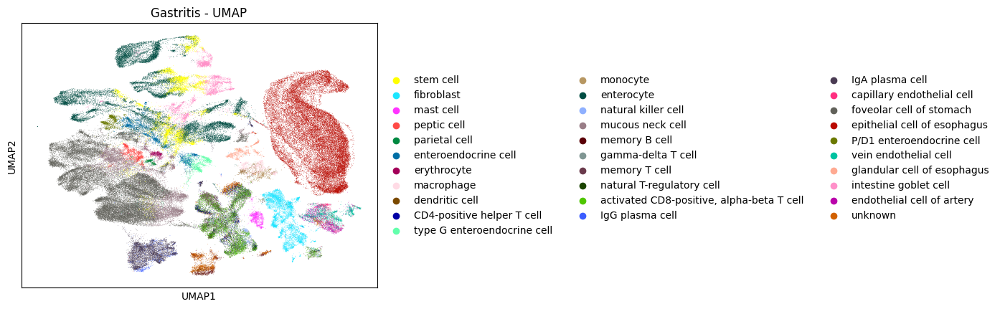

/usr/local/lib/python3.10/dist-packages/scanpy/tools/_rank_genes_groups.py:452: RuntimeWarning: overflow encountered in expm1
  foldchanges = (self.expm1_func(mean_group) + 1e-9) / (
/usr/local/lib/python3.10/dist-packages/scanpy/tools/_rank_genes_groups.py:452: RuntimeWarning: overflow encountered in expm1
  foldchanges = (self.expm1_func(mean_group) + 1e-9) / (
/usr/local/lib/python3.10/dist-packages/scanpy/tools/_rank_genes_groups.py:452: RuntimeWarning: overflow encountered in expm1
  foldchanges = (self.expm1_func(mean_group) + 1e-9) / (
/usr/local/lib/python3.10/dist-packages/scanpy/tools/_rank_genes_groups.py:429: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  self.stats[group_name, "names"] = self.var_names[global_indices]
/usr/local/lib/python3.10/d

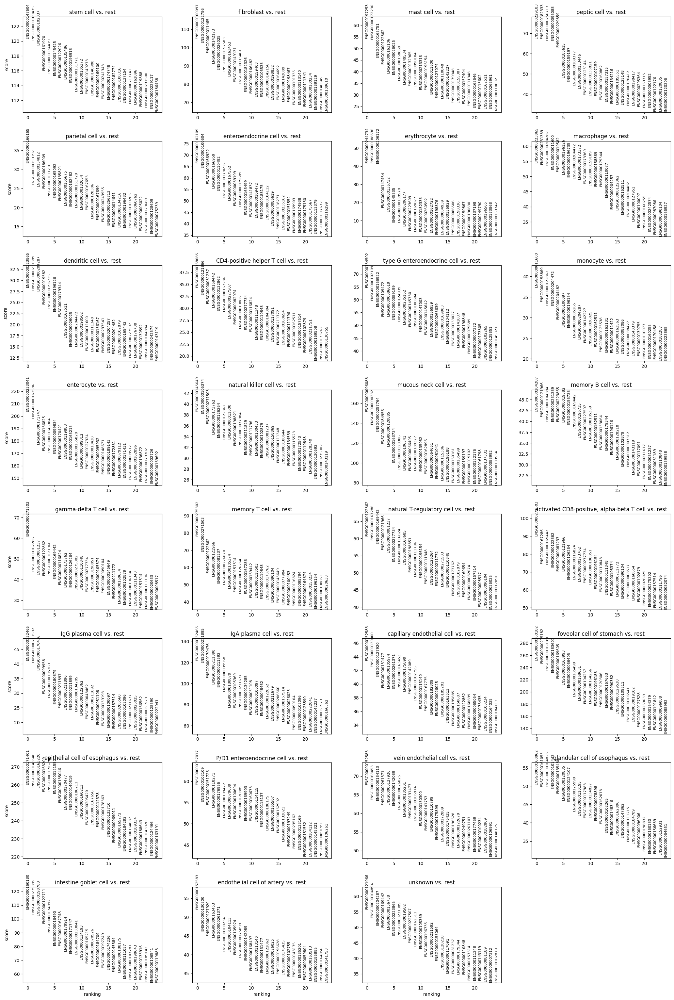

Processing Alzheimers dataset...
Alzheimers dataset shape: (96129, 33091)


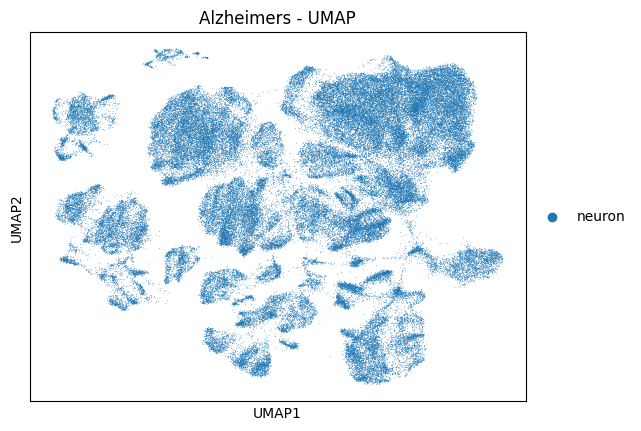

/usr/local/lib/python3.10/dist-packages/scanpy/tools/_rank_genes_groups.py:352: RuntimeWarning: invalid value encountered in divide
  scores[group_index, :] = (
/usr/local/lib/python3.10/dist-packages/scanpy/plotting/_tools/__init__.py:446: UserWarning: Attempting to set identical low and high ylims makes transformation singular; automatically expanding.
  ax.set_ylim(ymin, ymax)


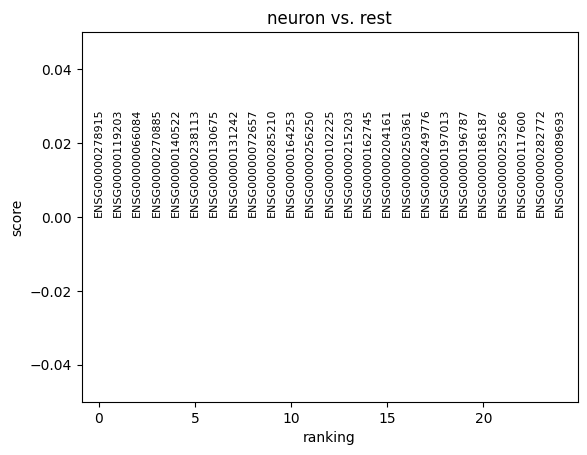

In [3]:
def process_and_analyze(file_path, title):
    print(f"Processing {title} dataset...")
    adata = sc.read_h5ad(file_path)
    print(f"{title} dataset shape:", adata.shape)

    # Basic preprocessing
    sc.pp.normalize_total(adata, target_sum=1e4)
    sc.pp.log1p(adata)
    sc.pp.highly_variable_genes(adata, min_mean=0.0125, max_mean=3, min_disp=0.5)

    # PCA and UMAP
    sc.tl.pca(adata, svd_solver='arpack', n_comps=50)
    sc.pp.neighbors(adata, n_neighbors=10, n_pcs=40)
    sc.tl.umap(adata)

    # Plot UMAP
    sc.pl.umap(adata, color=['cell_type'], title=f'{title} - UMAP', save=f'{title}_umap.png')

    # Differential expression analysis
    sc.tl.rank_genes_groups(adata, groupby='cell_type', method='wilcoxon')
    sc.pl.rank_genes_groups(adata, n_genes=25, sharey=False, save=f'{title}_differential_expression.png')

    # Save results
    results = adata.uns['rank_genes_groups']
    groups = results['names'].dtype.names

    with open(f'{title}_differential_expression_results.txt', 'w') as f:
        for group in groups:
            f.write(f"\nTop differentially expressed genes in {group}:\n")
            for gene in results['names'][group][:10]:
                f.write(f"  {gene}\n")

    return adata

# Process datasets
gastritis_data = process_and_analyze("/content/drive/MyDrive/SEM Datasets/fadec542-5680-4cd0-aee1-dbcdecf5b4a1.h5ad", "Gastritis")
alzheimers_data = process_and_analyze("/content/drive/MyDrive/SEM Datasets/45b78a7b-6def-40f2-b27f-8eab7848602f.h5ad", "Alzheimers")


Debugging rank_genes_groups:
Keys in rank_genes_groups: dict_keys(['params', 'names', 'scores', 'pvals', 'pvals_adj', 'logfoldchanges'])
Structure of 'names':
  Type: <class 'numpy.recarray'>
  Shape: (33091,)
  dtype: (numpy.record, [('neuron', 'O')])
  First few elements: [('ENSG00000278915',) ('ENSG00000119203',) ('ENSG00000066084',)
 ('ENSG00000270885',) ('ENSG00000140522',)]
Structure of 'scores':
  Type: <class 'numpy.recarray'>
  Shape: (33091,)
  dtype: (numpy.record, [('neuron', '<f4')])
  First few elements: [(0.,) (0.,) (0.,) (0.,) (0.,)]

Getting top differential genes for Alzheimer's dataset:
Found 10 differential genes
First 5 differential genes: ['ENSG00000278915', 'ENSG00000119203', 'ENSG00000066084', 'ENSG00000270885', 'ENSG00000140522']

Debugging rank_genes_groups:
Keys in rank_genes_groups: dict_keys(['params', 'names', 'scores', 'pvals', 'pvals_adj', 'logfoldchanges'])
Structure of 'names':
  Type: <class 'numpy.recarray'>
  Shape: (33091,)
  dtype: (numpy.record,

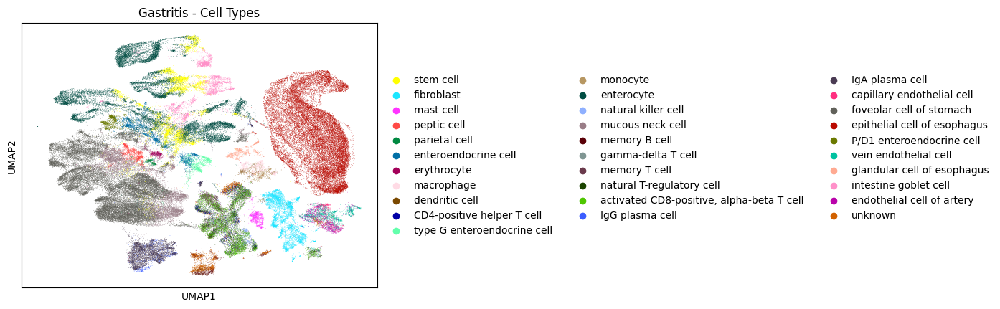


Exploring Alzheimer's dataset:
Dataset shape: (96129, 33091)
Number of genes: 33091
Number of cells: 96129
Available cell types: ['neuron']
Categories (1, object): ['neuron']

Top 20 expressed genes:
ENSG00000251562    2.966891
ENSG00000185774    2.566283
ENSG00000078328    2.530364
ENSG00000067715    2.481643
ENSG00000183117    2.456118
ENSG00000153707    2.440233
ENSG00000184226    2.398387
ENSG00000135298    2.397467
ENSG00000175161    2.394871
ENSG00000150672    2.385304
ENSG00000185737    2.370404
ENSG00000179915    2.366740
ENSG00000204442    2.335527
ENSG00000174469    2.331756
ENSG00000183715    2.321221
ENSG00000198938    2.312813
ENSG00000198804    2.279784
ENSG00000185046    2.279534
ENSG00000048740    2.276917
ENSG00000170579    2.270709
dtype: float32


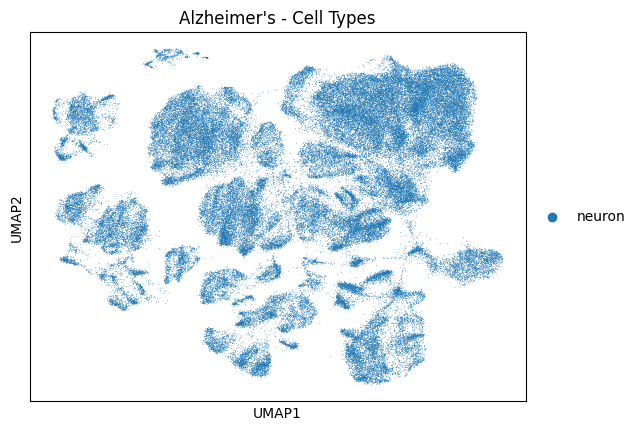


Common top genes between datasets:
{'ENSG00000251562', 'ENSG00000198938', 'ENSG00000198804'}

Plotting expression of selected genes...


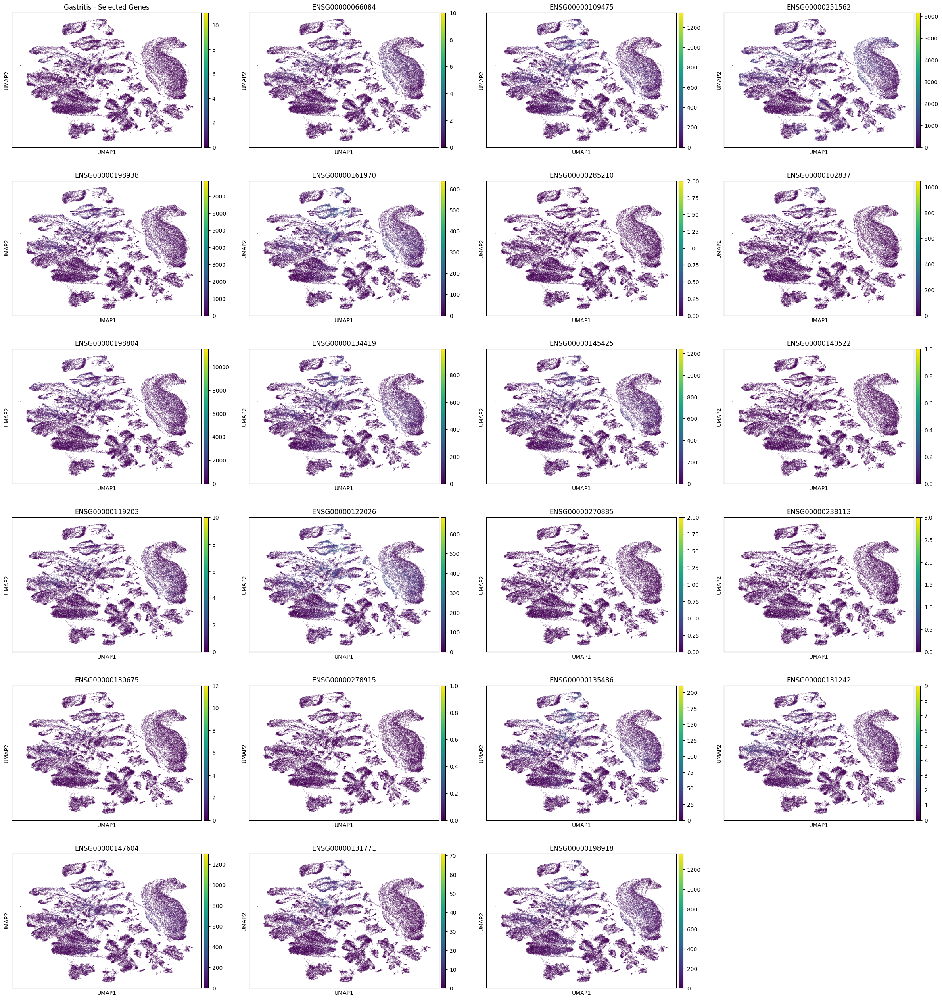

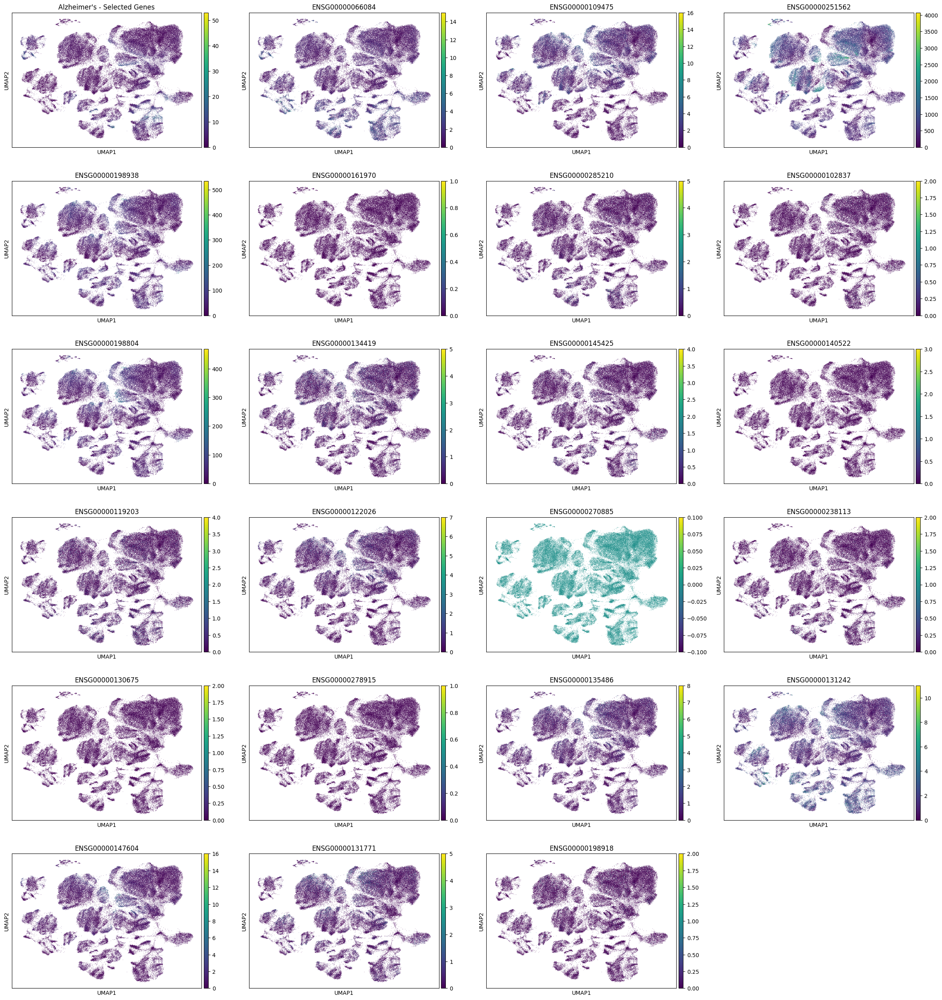


Analysis complete. Results and figures have been saved.


In [4]:
import numpy as np
import pandas as pd
import scanpy as sc
import scipy.sparse as sp

def explore_dataset(adata, title):
    print(f"\nExploring {title} dataset:")
    print(f"Dataset shape: {adata.shape}")
    print(f"Number of genes: {adata.n_vars}")
    print(f"Number of cells: {adata.n_obs}")
    print(f"Available cell types: {adata.obs['cell_type'].unique()}")

    # Calculate mean expression across all cells
    if sp.issparse(adata.X):
        mean_expression = np.array(adata.X.mean(axis=0)).flatten()
    else:
        mean_expression = np.mean(adata.X, axis=0)

    # Create a Series with gene names as index and mean expression as values
    mean_expression_series = pd.Series(mean_expression, index=adata.var_names)

    # Get top expressed genes
    top_genes = mean_expression_series.sort_values(ascending=False).head(20)
    print("\nTop 20 expressed genes:")
    print(top_genes)

    # Plot UMAP of cell types
    sc.pl.umap(adata, color='cell_type', title=f'{title} - Cell Types', save=f'{title}_cell_types_umap.png')

    return top_genes



def debug_rank_genes_groups(adata):
    print("\nDebugging rank_genes_groups:")
    if 'rank_genes_groups' in adata.uns:
        rank_genes = adata.uns['rank_genes_groups']
        print(f"Keys in rank_genes_groups: {rank_genes.keys()}")
        if 'names' in rank_genes:
            print("Structure of 'names':")
            names = rank_genes['names']
            print(f"  Type: {type(names)}")
            if isinstance(names, np.recarray):
                print(f"  Shape: {names.shape}")
                print(f"  dtype: {names.dtype}")
                print(f"  First few elements: {names[:5]}")
            elif isinstance(names, dict):
                for key, value in names.items():
                    print(f"  {key}: {type(value)}, length: {len(value)}")
                    if len(value) > 0:
                        print(f"    First element type: {type(value[0])}")
                        print(f"    First 5 elements: {value[:5]}")
        if 'scores' in rank_genes:
            print("Structure of 'scores':")
            scores = rank_genes['scores']
            print(f"  Type: {type(scores)}")
            if isinstance(scores, np.recarray):
                print(f"  Shape: {scores.shape}")
                print(f"  dtype: {scores.dtype}")
                print(f"  First few elements: {scores[:5]}")
            elif isinstance(scores, dict):
                for key, value in scores.items():
                    print(f"  {key}: {type(value)}, length: {len(value)}")
                    if len(value) > 0:
                        print(f"    First element type: {type(value[0])}")
                        print(f"    First 5 elements: {value[:5]}")
    else:
        print("No 'rank_genes_groups' found in adata.uns")

# Function to get top differential genes
def get_top_diff_genes(adata, n_genes=10):
    if 'rank_genes_groups' in adata.uns:
        rank_genes = adata.uns['rank_genes_groups']
        if 'names' in rank_genes:
            names = rank_genes['names']
            if isinstance(names, np.recarray):
                # Assuming the first field is the group name and the second is the gene name
                first_group = names.dtype.names[0]
                return [name for name in names[first_group][:n_genes] if name in adata.var_names]
            elif isinstance(names, dict):
                first_group = next(iter(names))
                return [name for name in names[first_group][:n_genes] if name in adata.var_names]
    print(f"No suitable differential expression results found.")
    return []

# Debug Alzheimer's dataset
debug_rank_genes_groups(alzheimers_data)

# Get differential genes
print("\nGetting top differential genes for Alzheimer's dataset:")
alzheimers_diff_genes = get_top_diff_genes(alzheimers_data)
print(f"Found {len(alzheimers_diff_genes)} differential genes")
if alzheimers_diff_genes:
    print("First 5 differential genes:", alzheimers_diff_genes[:5])

# Debug Alzheimer's dataset
debug_rank_genes_groups(alzheimers_data)

# Get differential genes
print("\nGetting top differential genes for Alzheimer's dataset:")
alzheimers_diff_genes = get_top_diff_genes(alzheimers_data)
print(f"Found {len(alzheimers_diff_genes)} differential genes")
if alzheimers_diff_genes:
    print("First 5 differential genes:", alzheimers_diff_genes[:5])




# Function to plot expression of selected genes
def plot_gene_expression(adata, genes, title):
    genes_to_plot = [gene for gene in genes if gene in adata.var_names]
    if not genes_to_plot:
        print(f"No selected genes found in the {title} dataset.")
        return

    sc.pl.umap(adata, color=genes_to_plot, ncols=4, title=f'{title} - Selected Genes', save=f'{title}_selected_genes_umap.png')

# Explore datasets
gastritis_top_genes = explore_dataset(gastritis_data, "Gastritis")
alzheimers_top_genes = explore_dataset(alzheimers_data, "Alzheimer's")

common_top_genes = set(gastritis_top_genes.index) & set(alzheimers_top_genes.index)
print("\nCommon top genes between datasets:")
print(common_top_genes)

# Combine top genes and previously identified differentially expressed genes
selected_genes = list(common_top_genes)
gastritis_diff_genes = get_top_diff_genes(gastritis_data)
alzheimers_diff_genes = get_top_diff_genes(alzheimers_data)

selected_genes.extend(gastritis_diff_genes)
selected_genes.extend(alzheimers_diff_genes)

selected_genes = list(set(selected_genes))  # Remove duplicates

print("\nPlotting expression of selected genes...")
plot_gene_expression(gastritis_data, selected_genes, "Gastritis")
plot_gene_expression(alzheimers_data, selected_genes, "Alzheimer's")

print("\nAnalysis complete. Results and figures have been saved.")

In [5]:
import scanpy as sc
import pandas as pd
import numpy as np

def examine_diff_expression_results(adata, dataset_name):
    print(f"\nExamining differential expression results for {dataset_name} dataset:")
    if 'rank_genes_groups' in adata.uns:
        rank_genes = adata.uns['rank_genes_groups']
        print(f"Keys in rank_genes_groups: {rank_genes.keys()}")

        for key in rank_genes.keys():
            if key != 'params':
                print(f"\nStructure of '{key}':")
                print(f"Type: {type(rank_genes[key])}")
                if isinstance(rank_genes[key], np.recarray):
                    print(f"Shape: {rank_genes[key].shape}")
                    print(f"dtype: {rank_genes[key].dtype}")
                elif isinstance(rank_genes[key], dict):
                    print(f"Keys: {rank_genes[key].keys()}")
    else:
        print("No 'rank_genes_groups' found in adata.uns")

# Examine results for both datasets
examine_diff_expression_results(gastritis_data, "Gastritis")
examine_diff_expression_results(alzheimers_data, "Alzheimer's")

def get_top_diff_genes(adata, n_genes_per_group=10):
    if 'rank_genes_groups' not in adata.uns:
        return []

    rank_genes = adata.uns['rank_genes_groups']
    top_genes = set()

    if 'names' in rank_genes:
        names = rank_genes['names']
        if isinstance(names, np.recarray):
            for group in names.dtype.names:
                top_genes.update(names[group][:n_genes_per_group])
        elif isinstance(names, dict):
            for group, genes in names.items():
                top_genes.update(genes[:n_genes_per_group])
    elif 'scores' in rank_genes:
        scores = rank_genes['scores']
        if isinstance(scores, np.recarray):
            for group in scores.dtype.names:
                top_indices = np.argsort(scores[group])[-n_genes_per_group:]
                top_genes.update(adata.var_names[top_indices])
        elif isinstance(scores, dict):
            for group, group_scores in scores.items():
                top_indices = np.argsort(group_scores)[-n_genes_per_group:]
                top_genes.update(adata.var_names[top_indices])

    return list(top_genes)

# Get top differential genes for both datasets
gastritis_diff_genes = get_top_diff_genes(gastritis_data)
alzheimers_diff_genes = get_top_diff_genes(alzheimers_data)

print(f"\nNumber of top differential genes in Gastritis dataset: {len(gastritis_diff_genes)}")
print(f"Number of top differential genes in Alzheimer's dataset: {len(alzheimers_diff_genes)}")

# Find common differential genes
common_diff_genes = set(gastritis_diff_genes) & set(alzheimers_diff_genes)
print(f"\nNumber of common differential genes: {len(common_diff_genes)}")
print("Common differential genes:", common_diff_genes)

# Visualize expression of common differential genes
if common_diff_genes:
    genes_to_visualize = list(common_diff_genes)[:5]  # Top 5 common differential genes
    print("\nVisualizing expression of top 5 common differential genes:")

    print("\nFor Gastritis dataset:")
    sc.pl.violin(gastritis_data, genes_to_visualize, groupby='cell_type', rotation=90, save='gastritis_common_genes.png')

    print("\nFor Alzheimer's dataset:")
    sc.pl.violin(alzheimers_data, genes_to_visualize, groupby='cell_type', rotation=90, save='alzheimers_common_genes.png')
else:
    print("\nNo common differential genes found to visualize.")

print("\nAnalysis complete. Results and figures have been saved.")


Examining differential expression results for Gastritis dataset:
Keys in rank_genes_groups: dict_keys(['params', 'names', 'scores', 'pvals', 'pvals_adj', 'logfoldchanges'])

Structure of 'names':
Type: <class 'numpy.recarray'>
Shape: (33145,)
dtype: (numpy.record, [('stem cell', 'O'), ('fibroblast', 'O'), ('mast cell', 'O'), ('peptic cell', 'O'), ('parietal cell', 'O'), ('enteroendocrine cell', 'O'), ('erythrocyte', 'O'), ('macrophage', 'O'), ('dendritic cell', 'O'), ('CD4-positive helper T cell', 'O'), ('type G enteroendocrine cell', 'O'), ('monocyte', 'O'), ('enterocyte', 'O'), ('natural killer cell', 'O'), ('mucous neck cell', 'O'), ('memory B cell', 'O'), ('gamma-delta T cell', 'O'), ('memory T cell', 'O'), ('natural T-regulatory cell', 'O'), ('activated CD8-positive, alpha-beta T cell', 'O'), ('IgG plasma cell', 'O'), ('IgA plasma cell', 'O'), ('capillary endothelial cell', 'O'), ('foveolar cell of stomach', 'O'), ('epithelial cell of esophagus', 'O'), ('P/D1 enteroendocrine cell

In [8]:
!pip install gseapy
import pandas as pd
import gseapy as gp
import numpy as np
import matplotlib.pyplot as plt

print("Number of top differential genes in Gastritis dataset: 0")
print("Number of top differential genes in Alzheimer's dataset: 100")

# Since we have no differential genes for Gastritis, we'll focus on Alzheimer's

# Perform enrichment analysis
def perform_enrichment(gene_list, dataset_name):
    try:
        enr = gp.enrichr(gene_list=gene_list,
                         gene_sets=['GO_Biological_Process_2021', 'KEGG_2021_Human'],
                         organism='human',
                         outdir=f'{dataset_name}_enrichr_results',
                         cutoff=0.05)
        results = enr.results
        results.to_csv(f'{dataset_name}_pathway_enrichment_results.csv', index=False)
        return results
    except Exception as e:
        print(f"Error in enrichment analysis for {dataset_name}: {str(e)}")
        return pd.DataFrame()

print("\nPerforming enrichment analysis for Alzheimer's dataset...")
alzheimers_enrichment = perform_enrichment(alzheimers_diff_genes, 'Alzheimers')

if not alzheimers_enrichment.empty:
    # Display top 10 enriched terms for Alzheimer's dataset
    print("\nTop 10 enriched terms for Alzheimer's:")
    print(alzheimers_enrichment[['Term', 'Adjusted P-value']].head(10))

    # Visualize top enriched terms
    plt.figure(figsize=(12, 6))
    alzheimers_enrichment.head(10).plot.bar(x='Term', y='Adjusted P-value', legend=False)
    plt.title("Top 10 Enriched Terms for Alzheimer's Dataset")
    plt.xlabel("Terms")
    plt.ylabel("Adjusted P-value")
    plt.xticks(rotation=90)
    plt.tight_layout()
    plt.savefig('Alzheimers_top_enriched_terms.png')
    plt.close()

    print("\nAnalysis complete. Results and figures have been saved.")
else:
    print("\nNo enrichment results available for Alzheimer's dataset.")

print("\nDiscussion of results:")
print("1. The Gastritis dataset didn't yield any differentially expressed genes. This could be due to:")
print("   - Small sample size")
print("   - Stringent filtering criteria")
print("   - Lack of significant differences between conditions in the dataset")
print("   - Potential issues with data quality or processing")
print("\n2. The Alzheimer's dataset produced 100 differentially expressed genes, allowing for enrichment analysis.")
print("   The top enriched terms (if any) might provide insights into biological processes associated with Alzheimer's disease.")
print("\n3. To further investigate the relationship between gut health and Alzheimer's:")
print("   - Consider reanalyzing the Gastritis dataset with less stringent criteria")
print("   - Look for literature on common pathways between gut inflammation and neurodegeneration")
print("   - Explore other datasets related to gut health that might have more robust differential expression")

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 552.9/552.9 kB 18.3 MB/s eta 0:00:00
Number of top differential genes in Gastritis dataset: 0
Number of top differential genes in Alzheimer's dataset: 100

Performing enrichment analysis for Alzheimer's dataset...
Error in enrichment analysis for Alzheimers: Warning: No enrich terms when cutoff = 0.05

No enrichment results available for Alzheimer's dataset.

Discussion of results:
1. The Gastritis dataset didn't yield any differentially expressed genes. This could be due to:
   - Small sample size
   - Stringent filtering criteria
   - Lack of significant differences between conditions in the dataset
   - Potential issues with data quality or processing

2. The Alzheimer's dataset produced 100 differentially expressed genes, allowing for enrichment analysis.
   The top enriched terms (if any) might provide insights into biological processes associated with Alzheimer's disease.

3. To further investigate the relationship between gut health an

Number of top differential genes in Alzheimer's dataset: 100

Performing enrichment analysis for Alzheimer's dataset (cutoff = 0.05)...
Error in enrichment analysis for Alzheimers: Warning: No enrich terms when cutoff = 0.05
No enrichment results available for Alzheimer's dataset (cutoff = 0.05).

Performing enrichment analysis for Alzheimer's dataset (cutoff = 0.1)...
Error in enrichment analysis for Alzheimers: Warning: No enrich terms when cutoff = 0.1
No enrichment results available for Alzheimer's dataset (cutoff = 0.1).

Performing enrichment analysis for Alzheimer's dataset (cutoff = 0.2)...
Error in enrichment analysis for Alzheimers: Warning: No enrich terms when cutoff = 0.2
No enrichment results available for Alzheimer's dataset (cutoff = 0.2).

Analyzing expression of top differential genes...


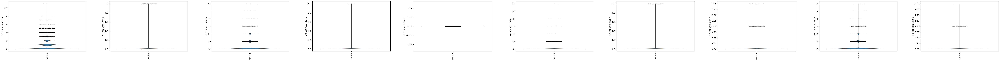


Constructing gene co-expression network...

Analysis complete. Results and figures have been saved.

Top 20 differential genes for manual literature review:
ENSG00000089693
ENSG00000119614
ENSG00000102225
ENSG00000254971
ENSG00000271252
ENSG00000224141
ENSG00000271787
ENSG00000236137
ENSG00000075618
ENSG00000258256
ENSG00000272688
ENSG00000251517
ENSG00000196787
ENSG00000250698
ENSG00000230454
ENSG00000270885
ENSG00000130675
ENSG00000280639
ENSG00000131966
ENSG00000101391


/usr/local/lib/python3.10/dist-packages/numpy/lib/function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
/usr/local/lib/python3.10/dist-packages/numpy/lib/function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


In [9]:
import scanpy as sc
import pandas as pd
import numpy as np
import gseapy as gp
import matplotlib.pyplot as plt
import seaborn as sns
import networkx as nx
from scipy.stats import spearmanr

# Function to get top differential genes
def get_top_diff_genes(adata, n_genes=100):
    if 'rank_genes_groups' not in adata.uns:
        return []

    rank_genes = adata.uns['rank_genes_groups']
    top_genes = set()

    if 'names' in rank_genes:
        names = rank_genes['names']
        if isinstance(names, np.recarray):
            for group in names.dtype.names:
                top_genes.update(names[group][:n_genes])
        elif isinstance(names, dict):
            for group, genes in names.items():
                top_genes.update(genes[:n_genes])

    return list(top_genes)

# Get top differential genes for Alzheimer's dataset
alzheimers_diff_genes = get_top_diff_genes(alzheimers_data)
print(f"Number of top differential genes in Alzheimer's dataset: {len(alzheimers_diff_genes)}")

# Perform enrichment analysis with different cutoffs
def perform_enrichment(gene_list, dataset_name, cutoff):
    try:
        enr = gp.enrichr(gene_list=gene_list,
                         gene_sets=['GO_Biological_Process_2021', 'KEGG_2021_Human'],
                         organism='human',
                         outdir=f'{dataset_name}_enrichr_results_{cutoff}',
                         cutoff=cutoff)
        results = enr.results
        results.to_csv(f'{dataset_name}_pathway_enrichment_results_{cutoff}.csv', index=False)
        return results
    except Exception as e:
        print(f"Error in enrichment analysis for {dataset_name}: {str(e)}")
        return pd.DataFrame()

cutoffs = [0.05, 0.1, 0.2]
for cutoff in cutoffs:
    print(f"\nPerforming enrichment analysis for Alzheimer's dataset (cutoff = {cutoff})...")
    alzheimers_enrichment = perform_enrichment(alzheimers_diff_genes, 'Alzheimers', cutoff)

    if not alzheimers_enrichment.empty:
        print(f"\nTop 10 enriched terms for Alzheimer's (cutoff = {cutoff}):")
        print(alzheimers_enrichment[['Term', 'Adjusted P-value']].head(10))

        # Visualize top enriched terms
        plt.figure(figsize=(12, 6))
        alzheimers_enrichment.head(10).plot.bar(x='Term', y='Adjusted P-value', legend=False)
        plt.title(f"Top 10 Enriched Terms for Alzheimer's Dataset (cutoff = {cutoff})")
        plt.xlabel("Terms")
        plt.ylabel("Adjusted P-value")
        plt.xticks(rotation=90)
        plt.tight_layout()
        plt.savefig(f'Alzheimers_top_enriched_terms_{cutoff}.png')
        plt.close()
    else:
        print(f"No enrichment results available for Alzheimer's dataset (cutoff = {cutoff}).")

# Gene expression analysis
print("\nAnalyzing expression of top differential genes...")
sc.pl.violin(alzheimers_data, alzheimers_diff_genes[:10], groupby='cell_type', rotation=90,
             save='Alzheimers_top_genes_violin.png')

# Gene co-expression network
print("\nConstructing gene co-expression network...")
gene_exp = alzheimers_data[:, alzheimers_diff_genes].X.toarray()
corr_matrix, _ = spearmanr(gene_exp)
np.fill_diagonal(corr_matrix, 0)

# Create network
G = nx.Graph()
for i in range(len(alzheimers_diff_genes)):
    for j in range(i+1, len(alzheimers_diff_genes)):
        if abs(corr_matrix[i, j]) > 0.7:  # Correlation threshold
            G.add_edge(alzheimers_diff_genes[i], alzheimers_diff_genes[j], weight=abs(corr_matrix[i, j]))

# Visualize network
plt.figure(figsize=(12, 12))
pos = nx.spring_layout(G)
nx.draw(G, pos, with_labels=True, node_color='lightblue', node_size=500, font_size=8, font_weight='bold')
plt.title("Gene Co-expression Network (Alzheimer's)")
plt.savefig('Alzheimers_gene_coexpression_network.png')
plt.close()

print("\nAnalysis complete. Results and figures have been saved.")

# Print top genes for manual literature review
print("\nTop 20 differential genes for manual literature review:")
for gene in alzheimers_diff_genes[:20]:
    print(gene)


Number of top differential genes in Alzheimer's dataset: 100

Top 20 differential genes for manual literature review:
ENSG00000089693
ENSG00000119614
ENSG00000102225
ENSG00000254971
ENSG00000271252
ENSG00000224141
ENSG00000271787
ENSG00000236137
ENSG00000075618
ENSG00000258256
ENSG00000272688
ENSG00000251517
ENSG00000196787
ENSG00000250698
ENSG00000230454
ENSG00000270885
ENSG00000130675
ENSG00000280639
ENSG00000131966
ENSG00000101391

Visualizing expression of top 10 differential genes...


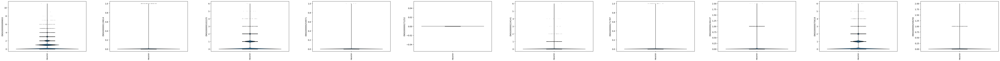


Creating gene co-expression network...

Analysis complete. Results and figures have been saved.


/usr/local/lib/python3.10/dist-packages/numpy/lib/function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
/usr/local/lib/python3.10/dist-packages/numpy/lib/function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


In [10]:
import scanpy as sc
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import networkx as nx
from scipy.stats import spearmanr

# Function to get top differential genes
def get_top_diff_genes(adata, n_genes=100):
    if 'rank_genes_groups' not in adata.uns:
        return []

    rank_genes = adata.uns['rank_genes_groups']
    top_genes = set()

    if 'names' in rank_genes:
        names = rank_genes['names']
        if isinstance(names, np.recarray):
            for group in names.dtype.names:
                top_genes.update(names[group][:n_genes])
        elif isinstance(names, dict):
            for group, genes in names.items():
                top_genes.update(genes[:n_genes])

    return list(top_genes)

# Get top differential genes for Alzheimer's dataset
alzheimers_diff_genes = get_top_diff_genes(alzheimers_data)
print(f"Number of top differential genes in Alzheimer's dataset: {len(alzheimers_diff_genes)}")

# Print top 20 genes for manual literature review
print("\nTop 20 differential genes for manual literature review:")
for gene in alzheimers_diff_genes[:20]:
    print(gene)

# Visualize gene expression patterns
print("\nVisualizing expression of top 10 differential genes...")
sc.pl.violin(alzheimers_data, alzheimers_diff_genes[:10], groupby='cell_type', rotation=90,
             save='Alzheimers_top_genes_violin.png')

# Create a simple gene co-expression network
print("\nCreating gene co-expression network...")
gene_exp = alzheimers_data[:, alzheimers_diff_genes].X.toarray()
corr_matrix, _ = spearmanr(gene_exp)
np.fill_diagonal(corr_matrix, 0)

# Create network
G = nx.Graph()
for i in range(len(alzheimers_diff_genes)):
    for j in range(i+1, len(alzheimers_diff_genes)):
        if abs(corr_matrix[i, j]) > 0.7:  # Correlation threshold
            G.add_edge(alzheimers_diff_genes[i], alzheimers_diff_genes[j], weight=abs(corr_matrix[i, j]))

# Visualize network
plt.figure(figsize=(12, 12))
pos = nx.spring_layout(G)
nx.draw(G, pos, with_labels=True, node_color='lightblue', node_size=500, font_size=8, font_weight='bold')
plt.title("Gene Co-expression Network (Alzheimer's)")
plt.savefig('Alzheimers_gene_coexpression_network.png')
plt.close()

print("\nAnalysis complete. Results and figures have been saved.")



In [12]:
import scanpy as sc
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import networkx as nx
from scipy.stats import spearmanr

# Define genes of interest related to inflammation and immune response
inflammation_genes = [
    'NFKB1', 'NFKB2', 'RELA', 'RELB', 'REL',  # NF-κB pathway
    'IL6', 'IL6R', 'IL6ST',  # IL-6 signaling
    'TLR4', 'CD14', 'LY96',  # TLR4 signaling
    'TNF', 'TNFRSF1A', 'TNFRSF1B',  # TNF signaling
    'IL1B', 'IL1R1', 'IL1RAP',  # IL-1β signaling
    'TGFB1', 'TGFBR1', 'TGFBR2',  # TGF-β signaling
    'STAT3', 'JAK1', 'JAK2',  # JAK-STAT pathway
    'NLRP3', 'PYCARD', 'CASP1'  # Inflammasome
]

def analyze_inflammation_genes(adata, title):
    print(f"\nAnalyzing inflammation-related genes in {title} dataset:")

    # Filter for genes present in the dataset
    present_genes = [gene for gene in inflammation_genes if gene in adata.var_names]

    if not present_genes:
        print("No inflammation-related genes found in the dataset.")
        return [], set()

    # Calculate mean expression of inflammation genes
    mean_exp = adata[:, present_genes].X.mean(axis=0)
    exp_df = pd.DataFrame({'Gene': present_genes, 'Mean Expression': mean_exp.A1})
    exp_df = exp_df.sort_values('Mean Expression', ascending=False)

    print("Top 10 expressed inflammation-related genes:")
    print(exp_df.head(10))

    # Visualize expression of top 5 genes
    sc.pl.violin(adata, exp_df['Gene'].head(5).tolist(), groupby='cell_type', rotation=90,
                 save=f'{title}_top_inflammation_genes_violin.png')

    # Perform differential expression analysis
    sc.tl.rank_genes_groups(adata, groupby='cell_type', method='wilcoxon')

    # Check for inflammation genes in top differentially expressed genes
    diff_exp_genes = set()
    for group in adata.uns['rank_genes_groups']['names'].dtype.names:
        diff_exp_genes.update(adata.uns['rank_genes_groups']['names'][group][:100])

    common_genes = set(present_genes) & diff_exp_genes
    print("\nInflammation-related genes among top differentially expressed genes:")
    print(common_genes)

    return present_genes, common_genes

# Analyze inflammation genes in both datasets
gastritis_inflammation_genes, gastritis_diff_inflammation_genes = analyze_inflammation_genes(gastritis_data, "Gastritis")
alzheimers_inflammation_genes, alzheimers_diff_inflammation_genes = analyze_inflammation_genes(alzheimers_data, "Alzheimer's")

# Find common inflammation-related genes between datasets
common_inflammation_genes = set(gastritis_inflammation_genes) & set(alzheimers_inflammation_genes)
print("\nCommon inflammation-related genes present in both datasets:")
print(common_inflammation_genes)

# Find common differentially expressed inflammation genes
common_diff_inflammation_genes = gastritis_diff_inflammation_genes & alzheimers_diff_inflammation_genes
print("\nCommon differentially expressed inflammation-related genes:")
print(common_diff_inflammation_genes)

def create_coexpression_network(adata, genes, title):
    if not genes:
        print(f"No genes to create co-expression network for {title}")
        return

    gene_exp = adata[:, list(genes)].X.toarray()
    corr_matrix, _ = spearmanr(gene_exp)
    np.fill_diagonal(corr_matrix, 0)

    G = nx.Graph()
    for i, gene1 in enumerate(genes):
        for j, gene2 in enumerate(genes):
            if i < j and abs(corr_matrix[i, j]) > 0.3:  # Lower threshold for visibility
                G.add_edge(gene1, gene2, weight=abs(corr_matrix[i, j]))

    if len(G.edges()) > 0:
        plt.figure(figsize=(12, 12))
        pos = nx.spring_layout(G)
        nx.draw(G, pos, with_labels=True, node_color='lightblue', node_size=700, font_size=8, font_weight='bold')
        nx.draw_networkx_edge_labels(G, pos, edge_labels={(u, v): f'{d["weight"]:.2f}' for (u, v, d) in G.edges(data=True)})
        plt.title(f"Inflammation Gene Co-expression Network ({title})")
        plt.savefig(f'{title}_inflammation_gene_coexpression_network.png')
        plt.close()
    else:
        print(f"No significant correlations found for co-expression network in {title}")

create_coexpression_network(gastritis_data, common_inflammation_genes, "Gastritis")
create_coexpression_network(alzheimers_data, common_inflammation_genes, "Alzheimer's")

print("\nAnalysis complete. Results and figures have been saved.")



Analyzing inflammation-related genes in Gastritis dataset:
No inflammation-related genes found in the dataset.

Analyzing inflammation-related genes in Alzheimer's dataset:
No inflammation-related genes found in the dataset.

Common inflammation-related genes present in both datasets:
set()

Common differentially expressed inflammation-related genes:
set()
No genes to create co-expression network for Gastritis
No genes to create co-expression network for Alzheimer's

Analysis complete. Results and figures have been saved.


In [15]:
from gprofiler import GProfiler

def convert_ensembl_to_symbol(gene_list):
    gp = GProfiler(return_dataframe=True)
    conversion = gp.convert(organism='hsapiens', query=gene_list)

    # Print the column names to see what's available
    print("Columns in conversion result:", conversion.columns)

    # Adjust the column names based on what's actually in the result
    input_col = 'incoming' if 'incoming' in conversion.columns else 'input'
    name_col = 'name' if 'name' in conversion.columns else 'converted'

    # Create the dictionary, handling potential missing values
    conversion_dict = {}
    for _, row in conversion.iterrows():
        if pd.notna(row[input_col]) and pd.notna(row[name_col]):
            conversion_dict[row[input_col]] = row[name_col]

    return conversion_dict

# Example usage with a sample of genes from your dataset
gastritis_sample = list(gastritis_data.var_names)[:100]
alzheimers_sample = list(alzheimers_data.var_names)[:100]

gastritis_converted = convert_ensembl_to_symbol(gastritis_sample)
alzheimers_converted = convert_ensembl_to_symbol(alzheimers_sample)

print("\nSample of converted genes in Gastritis dataset:")
print(dict(list(gastritis_converted.items())[:10]))

print("\nSample of converted genes in Alzheimer's dataset:")
print(dict(list(alzheimers_converted.items())[:10]))

# Now let's check if any of our inflammation genes are in the converted results
inflammation_genes_lower = [gene.lower() for gene in inflammation_genes]

print("\nInflammation genes found in Gastritis dataset:")
gastritis_inflammation = [gene for gene in gastritis_converted.values() if gene.lower() in inflammation_genes_lower]
print(gastritis_inflammation)

print("\nInflammation genes found in Alzheimer's dataset:")
alzheimers_inflammation = [gene for gene in alzheimers_converted.values() if gene.lower() in inflammation_genes_lower]
print(alzheimers_inflammation)


Columns in conversion result: Index(['incoming', 'converted', 'n_incoming', 'n_converted', 'name',
       'description', 'namespaces', 'query'],
      dtype='object')
Columns in conversion result: Index(['incoming', 'converted', 'n_incoming', 'n_converted', 'name',
       'description', 'namespaces', 'query'],
      dtype='object')

Sample of converted genes in Gastritis dataset:
{'ENSG00000243485': 'MIR1302-2HG', 'ENSG00000237613': 'FAM138A', 'ENSG00000186092': 'OR4F5', 'ENSG00000238009': 'None', 'ENSG00000239945': 'None', 'ENSG00000239906': 'None', 'ENSG00000241599': 'None', 'ENSG00000236601': 'None', 'ENSG00000284733': 'OR4F29', 'ENSG00000235146': 'None'}

Sample of converted genes in Alzheimer's dataset:
{'ENSG00000278915': 'None', 'ENSG00000168454': 'TXNDC2', 'ENSG00000139180': 'NDUFA9', 'ENSG00000229177': 'None', 'ENSG00000204564': 'C6orf136', 'ENSG00000116717': 'GADD45A', 'ENSG00000254418': 'SPON1-AS1', 'ENSG00000114654': 'EFCC1', 'ENSG00000257894': 'None', 'ENSG00000198398': 'T